# Project 2

### Scientific Question: How different are the variants of the 2019-nCoV spike protein sequences and structures compared to the non-variant Wuhan strain?

2019-nCoV, colloquially known as the human Coronavirus disease 2019 (COVID-19), is a contagious disease caused by severe acute respiratory syndrome coronavirus 2 (SARS-CoV-2). The first known case was identified in Wuhan, China in December 2019.The disease has since spread worldwide, leading to an ongoing pandemic and since the beginning of the year, news of variant strains had emerged.
Spike proteins make up the outermost component of a coronavirus virion particle; they are responsible for the recognition of receptors on mammalian hosts that is utilized by the coronavirus to enter the host cells. Without the spike (S) protein, viruses like the novel SARS-CoV-2 would not be able to interact with the cells of potential hosts like animals and humans to cause infection. As a result, the S protein represents an ideal target for vaccine and antiviral research endeavors.

The RNA/protein sequences of some of these variants were obtained from the National Center for Biotechnology Information (https://www.ncbi.nlm.nih.gov/) and the 3D protein strcutures from the RCSB Protein Data Bank (https://www.rcsb.org/). 

As stated on these websites:
"The NCBI has been charged with creating automated systems for storing and analyzing knowledge about molecular biology, biochemistry, and genetics; facilitating the use of such databases and software by the research and medical community; coordinating efforts to gather biotechnology information both nationally and internationally; and performing research into advanced methods of computer-based information processing for analyzing the structure and function of biologically important molecules."

"The RSCB PDB is founded upon Protein Data Bank archive-information about the 3D shapes of proteins, nucleic acids, and complex assemblies that helps students and researchers understand all aspects of biomedicine and agriculture, from protein synthesis to health and disease."

### Scientific Hypothesis: If there is a mutation in the nucleotide sequence of 2019-nCoV, then the structure of the spike protein will differ from that of the original Wuhan Strain. Despite a change in structure, there will be a >99% sequence similarity when strains are compared to one another.

Viruses have a high mutation rate and as a result, there are numerous known and unknown variants of the Coronavirus. Five different strains of human coronavirus were converted from a protein seqeunce to an RNA sequence and were saved as a .fasta file. Pairwise sequence alignment was conducted between the five sequences to find similarities between sequences. Then the protein structures of five spike proteins were shown using NGLview in Python.
To find the protein/RNA sequences of a human coronavirus strain, I used various searches on NCBI (https://www.ncbi.nlm.nih.gov/) including "spike protein coronavirus", "spike glycoprotein coronavirus", "spike protein SARS-CoV-2", and other related/similar searches. After finding a spike protein of interest I click on the hyperlink and scroll down to the section that says "genomic regions, transcripts, and products" then click "FASTA", then click "Send to:" ,"Coding sequences", on format click "FASTA Nucleotide" and click "create file". If the option of "Coding Sequences" is not avalable, I copied and pasted the protein sequence into https://www.ebi.ac.uk/Tools/st/emboss_backtranseq/ so that it converts the desired protein seqeunce into a nucleotide sequence. The resulting text was copied and pasted into a notebook file where it was saved as a .fasta file.  
To find protein structures of coronavirus spike proteins I first installed the nglView package from its github page https://github.com/nglviewer/nglview. After succesfully installing the package. I went to https://www.rcsb.org and searched for "spike glycoprotein coronavirus", "spike protein SARS-CoV-2", and other related/similar searches; I also made sure to filter in refinements to Severe acute respiratory syndrome coronavirus 2". After finding five human coronavirus spike proteins I copied the name of each spike protein and pasted it into my jupyter notebook and used NGLview to display the image of each protein. 


### Loading packages
Packages include the following:
- SeqIO: SeqIO is a Biopython Package with functions to parse sequence files and create SeqRecord Objects

- pairwise2: pariwise 2 is a Biopython Package that takes in sequences and calculates the optimal alignment and score for them

- numpy: Numpy is a library that adds support for multi-dimensional arrays and matrices, along with many mathematical functions to operate on these arrays.

- nglview: NGLview is a Jupyter widget that displays interactive views of 3D molecular structures and trajectories in notebooks.

- seaborn: Seaborn is a Python data visualization library that provides  interface for drawing attractive and informative statistical graphics.

- pandas: Pandas is a python library that allows for data manipulation and analysis of numerical tables.

In [4]:
# Importing neccesary Python packages
from Bio import SeqIO 
from Bio import pairwise2 
import numpy as np 
import nglview 
import seaborn as sns
import pandas as pd

Matplotlib is building the font cache; this may take a moment.


### Parsing FASTA files and performing Bioinformatic Analyses (Pairwise Sequence Alignment, Heatmap, and NGLView)
FASTA files are a text-based format for representing nucleotide or amino acid sequences which are represented using single-letter codes. The format also allows for sequence names and comments to precede the sequences. Pairwise Sequence Alignment is a bioinformatic method that is used to identify regions of similarity between two protein or nucleic acid seqeunces that may indicate functional, structural, and/or evolutionary relationships between them. A heat map is a data visualization technique that shows magnitude of a phenomenon as color, in this case the difference in sequence alignment scores. NGLview uses the RCSB Protein Data Bank archive and information to extrapolate and depict a three dimensional, interactive representation of a desired protein.

In [17]:
   
#parsing fasta files, each line is parsing a fasta file contianing a sequence of different COVID strains
seq1 = SeqIO.read("WT_ sequence.fasta", "fasta")
seq2 = SeqIO.read("ATCC_strain.fasta", "fasta")
seq3= SeqIO.read("OC_43_strain.fasta", "fasta")
seq4= SeqIO.read("generic_strain.fasta", "fasta")
seq5= SeqIO.read("QLI_strain.fasta", "fasta")

#creating a list that contains each sequence
allFasta= (seq1,seq2,seq3,seq4,seq5)

# indexing the previous list 
x= allFasta[0]
y = allFasta[1]
#To check that indexing the list is working
aligned = allFasta[0]
print(aligned)

#creating an array for the sequence alignment scores with dimensions that match the length of the sequence list
alignments = np.empty(shape = (len(allFasta),len(allFasta)))

#using a nested for loop that loops through each possible pair of sequences
for f in range (len(allFasta)):
    for g in range (len(allFasta)):
        x= allFasta[f].seq
        y= allFasta[g].seq
        
# Finding alignment score between each sequence 
        alignments[f,g] = pairwise2.align.globalxx(x, y, score_only = True)
print(alignments)




ID: lcl|NC_045512.2_cds_YP_009724390.1_1
Name: lcl|NC_045512.2_cds_YP_009724390.1_1
Description: lcl|NC_045512.2_cds_YP_009724390.1_1 [gene=S] [locus_tag=GU280_gp02] [db_xref=GeneID:43740568] [protein=surface glycoprotein] [protein_id=YP_009724390.1] [location=21563..25384] [gbkey=CDS]
Number of features: 0
Seq('ATGTTTGTTTTTCTTGTTTTATTGCCACTAGTCTCTAGTCAGTGTGTTAATCTT...TAA')
[[3822. 2671. 2459. 2737. 2737.]
 [2671. 4062. 2896. 2401. 2401.]
 [2459. 2896. 4059. 2810. 2810.]
 [2737. 2401. 2810. 3819. 3819.]
 [2737. 2401. 2810. 3819. 3819.]]


### Creating a heatmap to show the normalized Alignment scores between strains
Seaborn is being used to create a heatmap that will be printed out. Each box closest to the x and y axes, are labeled by strain abbreviation; respective pairwise sequence alignment scores are printed in each square. The color bar is labeled and the key is localized to the Wuhan, Wuhan square. White lines were added to seperate each box and display the data more neatly. The plot is saved and displayed. 

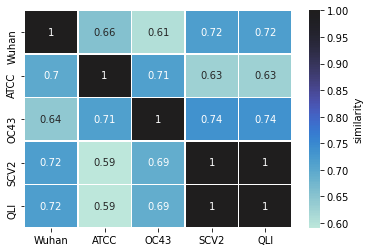

In [18]:
#hard code to normalize dataset
df= pd.DataFrame({'Wuhan':[3822/3822, 2671/3822, 2459/3822, 2737/3822, 2737/3822],
                'ATCC':[2671/4062, 4062/4062, 2896/4062, 2401/4062, 2401/4062], 
                'OC43':[2459/4059, 2896/4059, 4059/4059, 2810/4059, 2810/4059],
                'SCV2':[2737/3819, 2401/3819, 2810/3819, 3819/3819, 3819/3819],
               'QLI':[2737/3819, 2401/3819, 2810/3819, 3819/3819, 3819/3819]})
#labeling each row            
df.index =['Wuhan', 'ATCC', "OC43", 'SCV2', 'QLI']
df
ax=sns.heatmap(df, annot=True, linewidths= .5, center=df.loc['Wuhan', 'Wuhan'], 
                                                             cbar_kws = {'label': 'similarity'})



### Results Analysis
The heatmap above shows the normalized alignment scores between all five strains, and the further above pairwise sequence alignment shows the non-normalized alignment scores. The raw alignment scores indicate that the sequences are very dissimilar from one another.In fact, the dissimilarities were so vast,a BLAST search was unable to provide percent similarity scores for all but one combination of my sequences. This dissimilarity is emphasized in the below protein visualizations, as each protein is very unique and wildly distinct from one another. 

### Protein Visualization 

In [9]:
#Showing 3D protein structure
view = nglview.show_pdbid("3pqr")  # 3pqr is negative control it is not a protein related to COVID
# Below proteins are all human COVID spike proteins
view

NGLWidget()

In [10]:
view = nglview.show_pdbid("7krs")
view

NGLWidget()

In [11]:
view = nglview.show_pdbid("7cwn")
view

NGLWidget()

In [12]:
view = nglview.show_pdbid("7cwo")
view

NGLWidget()

In [13]:
view = nglview.show_pdbid("6nzk")
view

NGLWidget()

In [14]:
view = nglview.show_pdbid("7cwm")
view

NGLWidget()

### Conclusion:
My hypothesis was incorrect and in fact, mutations of COVID-19 spike proteins cause drastic differences in both the nucleotide sequence and structure of the protein. 